In [43]:
import numpy as np
from pygeotools.lib import iolib,geolib,warplib,malib
from autoRIFT import autoRIFT
from imview import pltlib
import matplotlib.pyplot as plt
import os,sys,glob,shutil

In [2]:
l_img = '/nobackupp2/sbhusha1/vmap_comparison_testing/Cropped/LC08_L1TP_061018_20180304_20180319_01_T1_B8_s.TIF'
r_img = '/nobackupp2/sbhusha1/vmap_comparison_testing/Cropped/LC08_L1TP_061018_20180608_20180615_01_T1_B8_s.TIF'

In [3]:
l_img_ds = iolib.fn_getds(l_img)
r_img_ds = iolib.fn_getds(r_img)

In [4]:
l_img_ma = iolib.ds_getma(l_img_ds)
r_img_ma = iolib.ds_getma(r_img_ds)

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

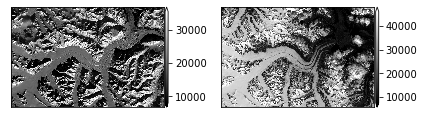

In [5]:
f,ax = plt.subplots(1,2)
pltlib.iv(l_img_ma,ax=ax[0],cmap='gray')
pltlib.iv(r_img_ma,ax=ax[1],cmap='gray')

#### Parameters
Relate to Gardner et al. 2018 and original values in repo

In [26]:
chip_size_min = 32
chip_size_max = 64
skip_rate = 4
contrast_filter = 'walis'
walis_filter_width = 5

In [27]:
obj = autoRIFT()

In [28]:
obj.ChipSizeMinX = chip_size_min
obj.ChipSizeMaxX = chip_size_max
# check and refine this
obj.ChipSize0X = chip_size_min
# skip rate setup
obj.SkipSampleX = skip_rate
obj.SkipSampleY = skip_rate

In [29]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma

In [30]:
obj.preprocess_filt_hps()

In [12]:
#obj.WallisFilterWidth = walis_filter_width

In [13]:
#obj.preprocess_filt_wal()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:69: RuntimeWarning: invalid value encountered in sqrt
  s = np.sqrt(m2 - m**2) * np.sqrt(np.sum(kernel)/(np.sum(kernel)-1.0))
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:81: RuntimeWarning: invalid value encountered in sqrt
  s = np.sqrt(m2 - m**2) * np.sqrt(np.sum(kernel)/(np.sum(kernel)-1.0))


In [31]:
obj.uniform_data_type()

In [33]:
iolib.cpu_count()

32

In [34]:
obj.MultiThread = iolib.cpu_count()

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

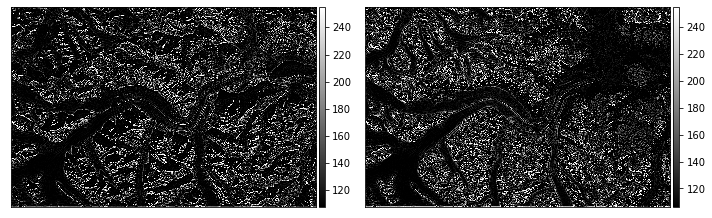

In [35]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [36]:
print("creating correlation grid")
# create the grid if it does not exist (from test_autoRIFT.py)
m,n = obj.I1.shape
xGrid = np.arange(obj.SkipSampleX+10,n-obj.SkipSampleX,obj.SkipSampleX)
yGrid = np.arange(obj.SkipSampleY+10,m-obj.SkipSampleY,obj.SkipSampleY)
nd = xGrid.__len__()
md = yGrid.__len__()
obj.xGrid = np.int32(np.dot(np.ones((md,1)),np.reshape(xGrid,(1,xGrid.__len__()))))
obj.yGrid = np.int32(np.dot(np.reshape(yGrid,(yGrid.__len__(),1)),np.ones((1,nd))))
noDataMask = np.logical_not(obj.xGrid)

creating correlation grid


In [37]:
obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


In [41]:
%matplotlib notebook

In [46]:
malib.calcperc(np.ma.fix_invalid(obj.Dy),(2,98))

(-23.8125, 24.107288742065403)

<IPython.core.display.Javascript object>


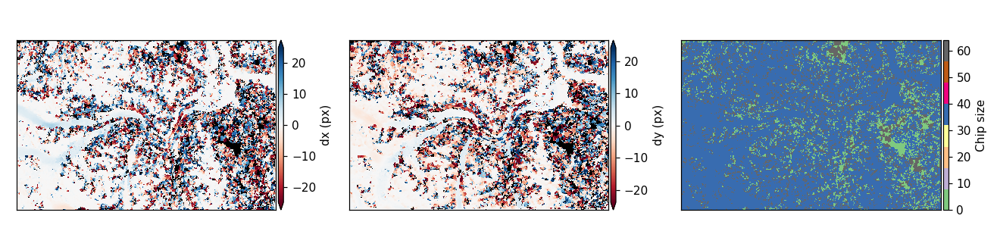

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [47]:
f,ax = plt.subplots(1,3,figsize=(12,3))
pltlib.iv(np.ma.fix_invalid(obj.Dx),ax=ax[0],cmap='RdBu',label='dx (px)')
pltlib.iv(np.ma.fix_invalid(obj.Dy),ax=ax[1],cmap='RdBu',label='dy (px)')
pltlib.iv(obj.ChipSizeY,ax=ax[2],cmap='Accent',label='Chip size')

In [48]:
# mask out edge-nodata values
noDataMask = np.logical_not(obj.xGrid)
import cv2
kernel = np.ones((9,9),np.uint8)
noDataMask = cv2.dilate(noDataMask.astype(np.uint8),kernel,iterations = 1)
noDataMask = noDataMask.astype(np.bool)

<IPython.core.display.Javascript object>


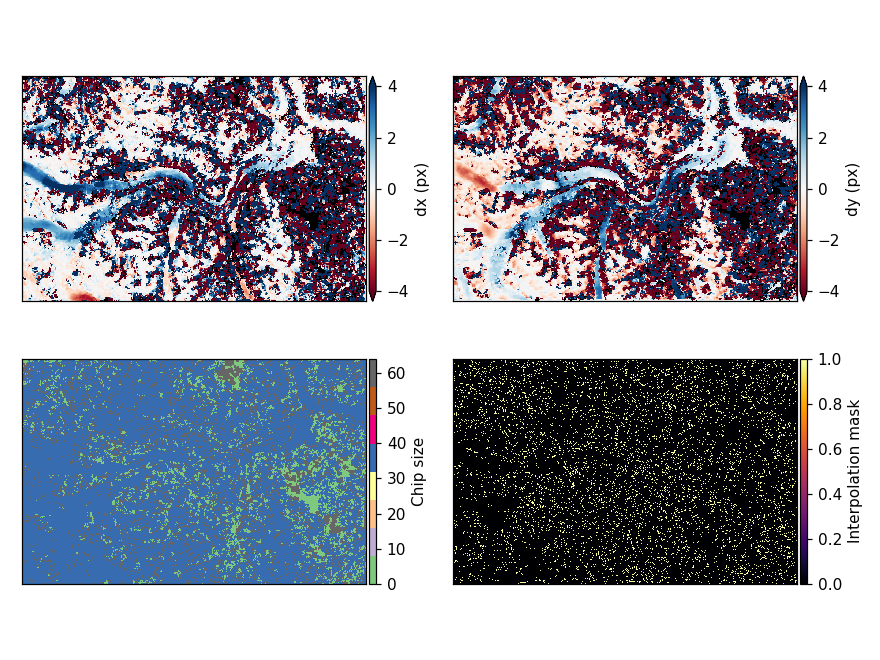

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


<AxesSubplot:>

In [54]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


The correlator seems to work, but the high pass filter produces noises off glacier, correlating with shadowed areas. This should be taken care by Walis filter, but it did not work on the original images. Lets try with the images which have undergone high-pass filtering.

In [55]:
obj.WallisFilterWidth

21

In [56]:
obj.preprocess_filt_wal()

<IPython.core.display.Javascript object>


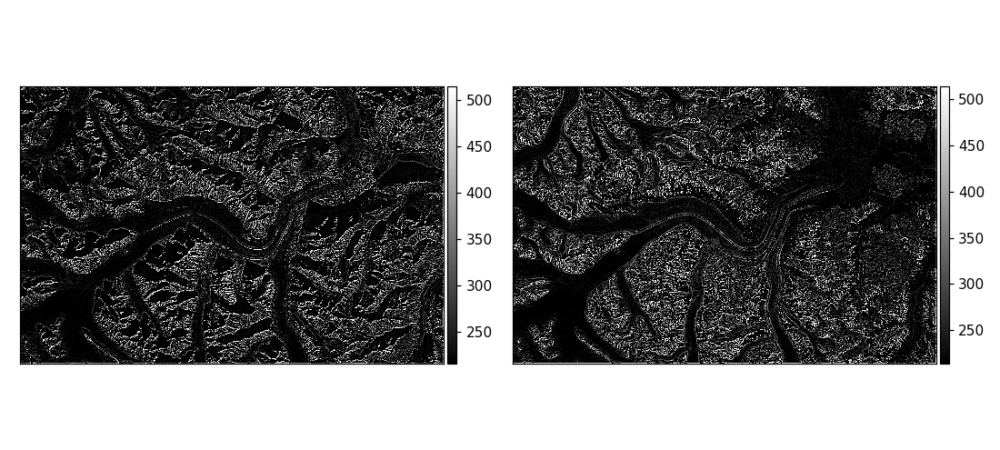

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [57]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

### multi-threading does not work for float array correlator. I installed via conda, so not sure how to reflect active changes to code in the working environment.

In [63]:
obj.MultiThread = 0

In [64]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 8min 1s, sys: 2min 23s, total: 10min 25s
Wall time: 17min 57s


In [67]:
# mask out edge-nodata values
noDataMask = np.logical_not(obj.xGrid)
import cv2
kernel = np.ones((3,3),np.uint8)
noDataMask = cv2.dilate(noDataMask.astype(np.uint8),kernel,iterations = 1)
noDataMask = noDataMask.astype(np.bool)

<IPython.core.display.Javascript object>


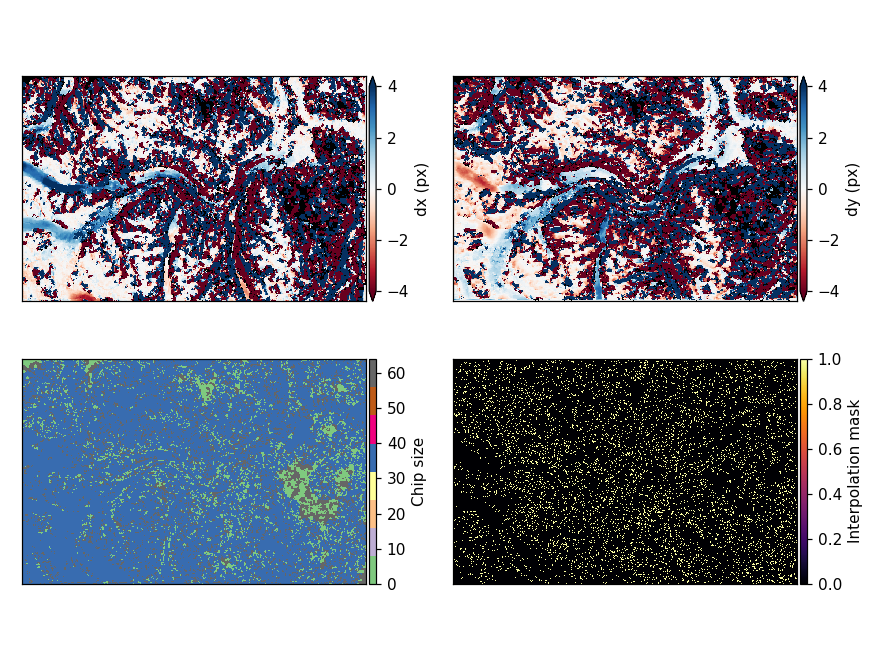

<AxesSubplot:>

In [68]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


In [69]:
obj.FiltWidth

5

In [70]:
obj.SearchLimitX

array([[25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       ...,
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.]], dtype=float32)

In [71]:
obj.SearchLimitY

array([[25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       ...,
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.],
       [25., 25., 25., ..., 25., 25., 25.]], dtype=float32)

In my opinion, limiting this searchlimit param in the x and y direction should be able to get rid of the high-correlation artifacts.

In [72]:
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [73]:
obj.MultiThread = iolib.cpu_count()
obj.uniform_data_type()

In [74]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 51.4 s, sys: 1min 10s, total: 2min 1s
Wall time: 1min 59s


In [75]:
# mask out edge-nodata values
noDataMask = np.logical_not(obj.xGrid)
import cv2
kernel = np.ones((3,3),np.uint8)
noDataMask = cv2.dilate(noDataMask.astype(np.uint8),kernel,iterations = 1)
noDataMask = noDataMask.astype(np.bool)

<IPython.core.display.Javascript object>


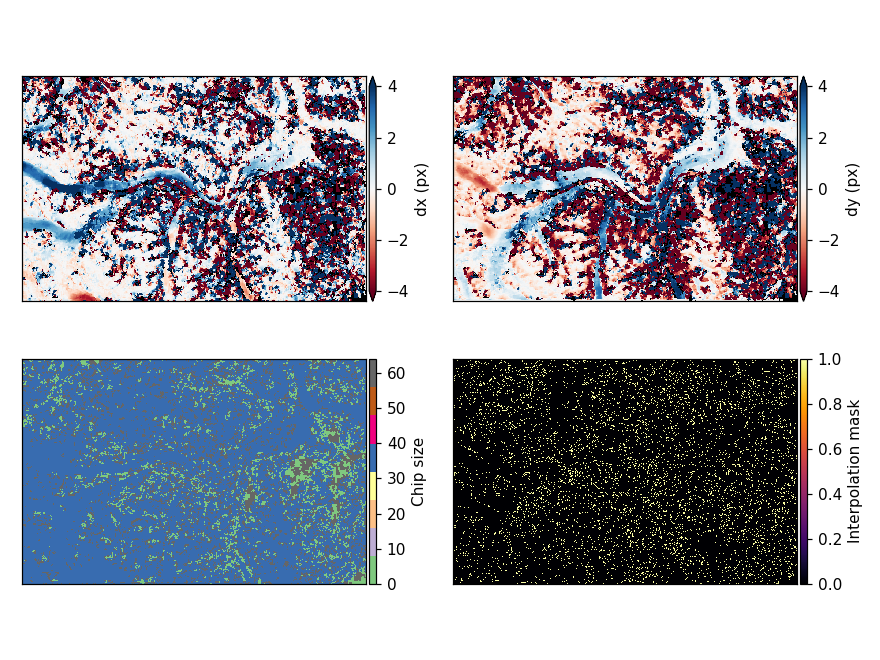

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [76]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


In [78]:
obj.SearchLimitX.shapepe

(616, 940)

* This looks better ! 
* Ok, so using seeding, we should be better.
* Now I test the other filtering mode: high_pass+wallis(5*5), uniform_data_type()

In [94]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma

In [95]:
obj.preprocess_filt_hps()

<IPython.core.display.Javascript object>


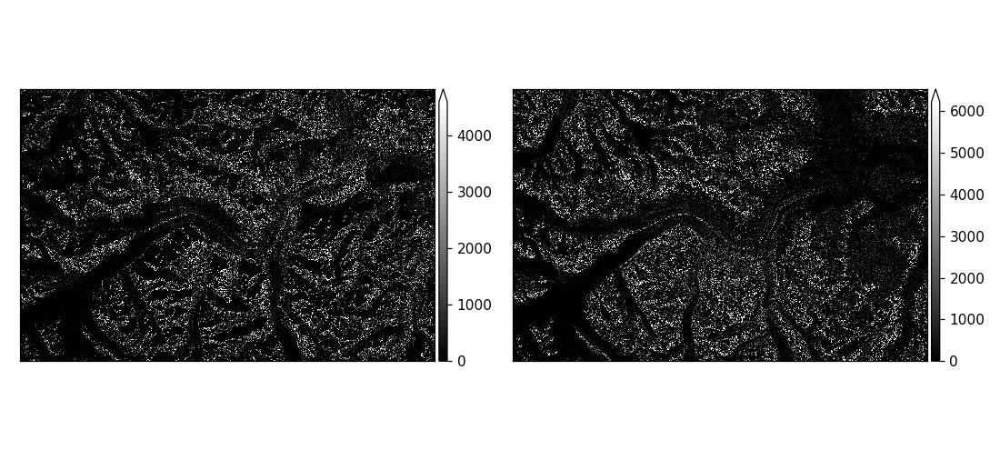

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [96]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

obj.WallisFilterWidth = 5

obj.preprocess_filt_wal()

f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [97]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


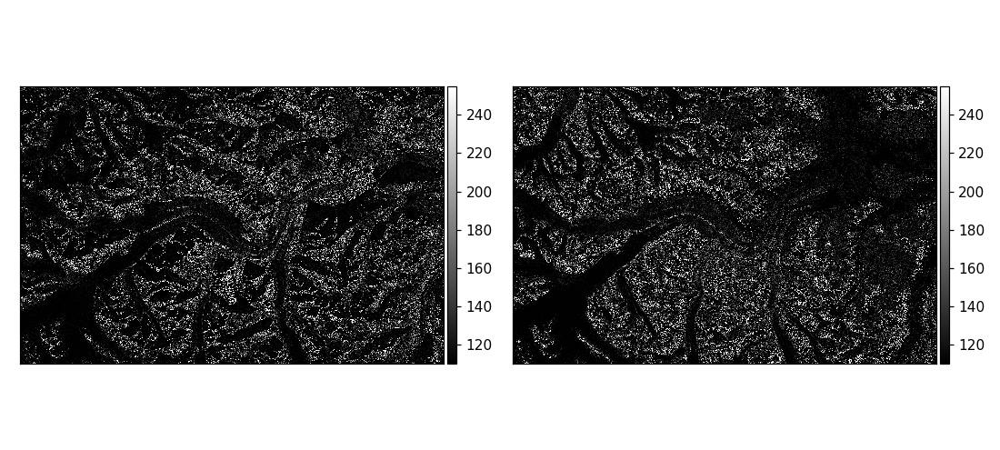

<AxesSubplot:>

In [98]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [99]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [100]:
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [101]:
#rerun correlator
%time obj.runAutorift()

CPU times: user 49.4 s, sys: 2min, total: 2min 49s
Wall time: 4min 56s


<IPython.core.display.Javascript object>


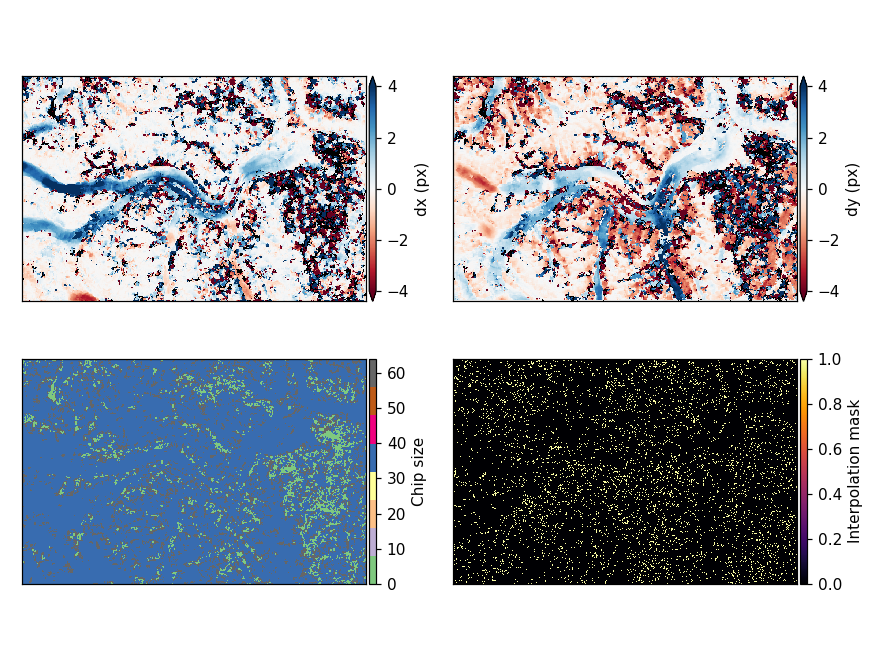

<AxesSubplot:>

In [102]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


In [103]:
obj.WallisFilterWidth

5

So with a high pass filter with 5 px WallisFilterWidth worked pretty well. But you know, to a non-math chap, a plot always makes more sense. Lets see how the constructed high-pass filter with the supplied 5 pixel width look.
See autoRIFT filters here: https://github.com/leiyangleon/autoRIFT/blob/3bf089c70fefd3c7ad09ce74079e8218f2ce46e6/geo_autoRIFT/autoRIFT/autoRIFT.py

In [104]:
# high-pass filter block
kernel = -np.ones((obj.WallisFilterWidth,obj.WallisFilterWidth), dtype=np.float32)

In [106]:
kernel

array([[-1., -1., -1., -1., -1.],
       [-1., -1., -1., -1., -1.],
       [-1., -1., -1., -1., -1.],
       [-1., -1., -1., -1., -1.],
       [-1., -1., -1., -1., -1.]], dtype=float32)

<IPython.core.display.Javascript object>


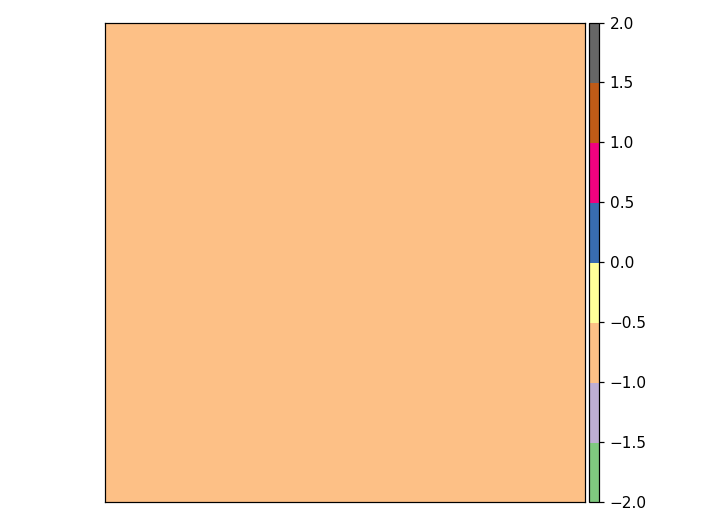

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [110]:
f,ax = plt.subplots()
pltlib.iv(np.ma.array(kernel),ax=ax,clim=(-2,2),cmap='Accent')

In [112]:
kernel[int((obj.WallisFilterWidth-1)/2),int((obj.WallisFilterWidth-1)/2)] = kernel.size - 1

<IPython.core.display.Javascript object>


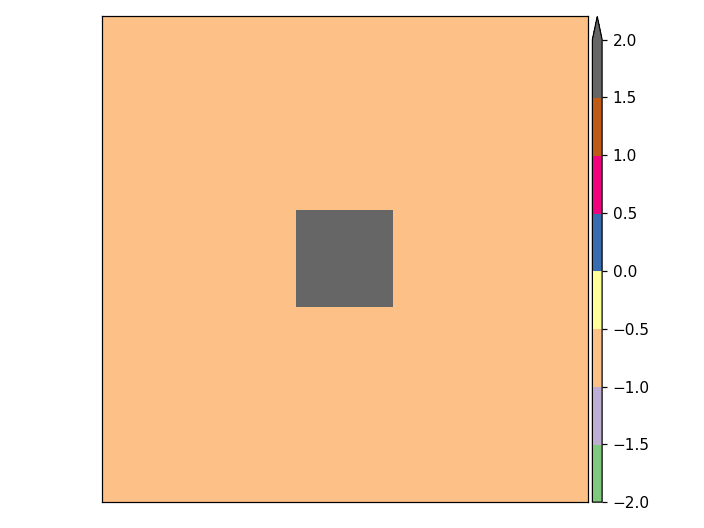

<AxesSubplot:>

In [113]:
f,ax = plt.subplots()
pltlib.iv(np.ma.array(kernel),ax=ax,clim=(-2,2),cmap='Accent')

In [114]:
kernel = kernel / kernel.size

<IPython.core.display.Javascript object>


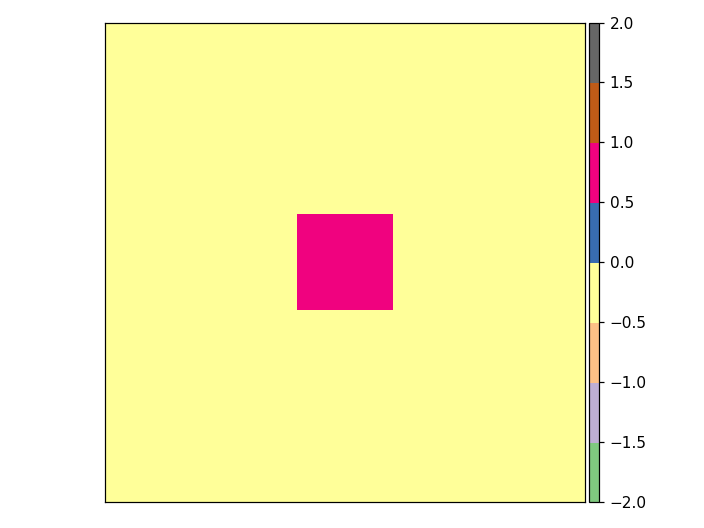

<AxesSubplot:>

In [115]:
f,ax = plt.subplots()
pltlib.iv(np.ma.array(kernel),ax=ax,clim=(-2,2),cmap='Accent')

In [117]:
kernel.shape

(5, 5)

This is passed to the opencv 2D filter (see averaging filter tutorial [here](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html) and [here](https://pythonexamples.org/python-opencv-image-filter-convolution-cv2-filter2d/).

To

Now trying sobel.

In [118]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 5

In [119]:
obj.preprocess_filt_sob()

In [120]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


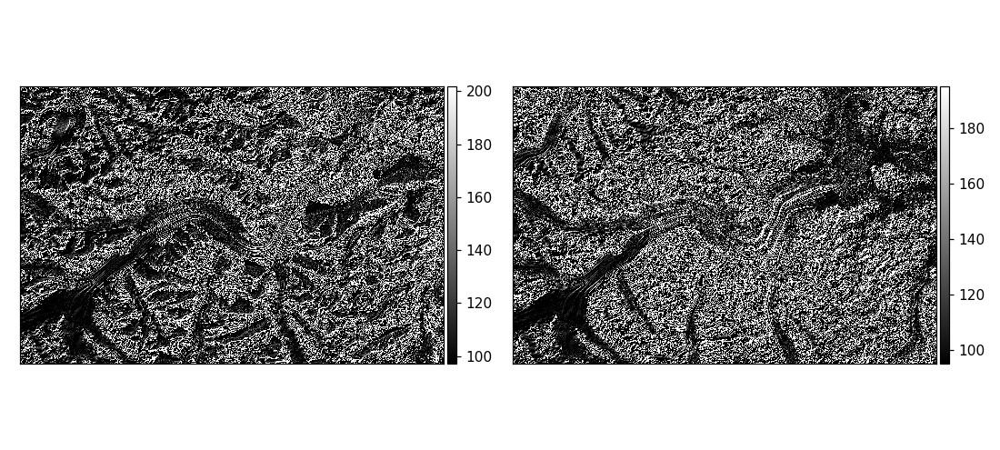

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [121]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [122]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [123]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 51.8 s, sys: 1min 27s, total: 2min 19s
Wall time: 1min 59s


<IPython.core.display.Javascript object>


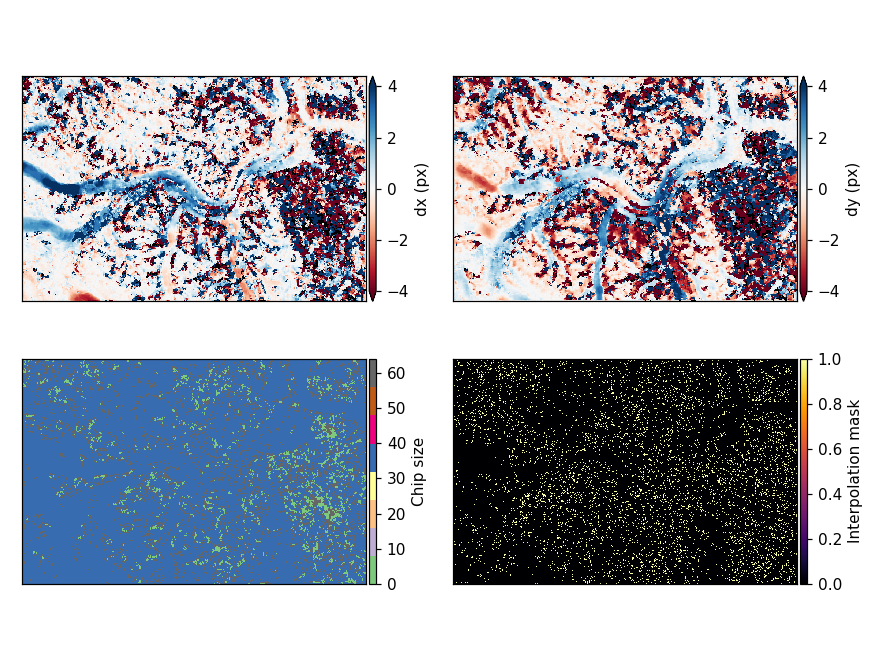

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [124]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


Ok this is pretty simillar, can we check with a bigger kernelwidth before checking the new filter type.

In [125]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 15

In [126]:
obj.preprocess_filt_sob()

In [127]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


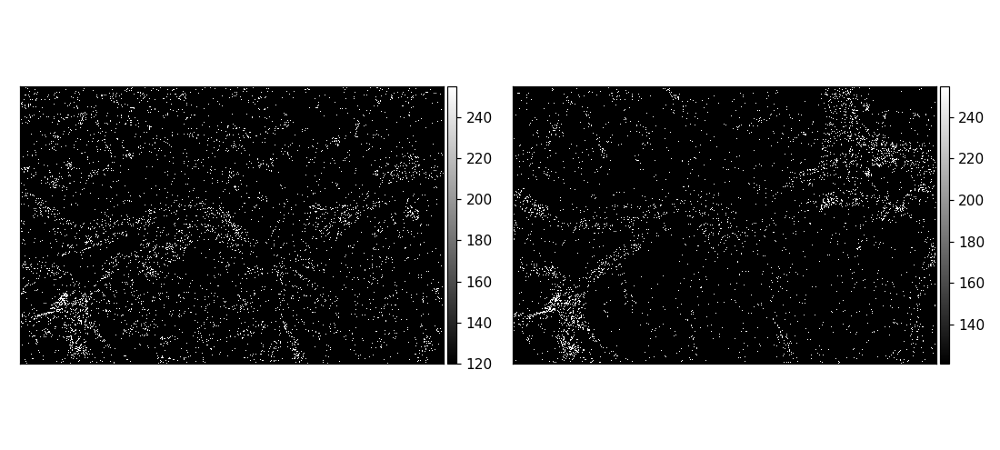

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [128]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [129]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [130]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 48.7 s, sys: 1min 19s, total: 2min 8s
Wall time: 1min 53s


<IPython.core.display.Javascript object>


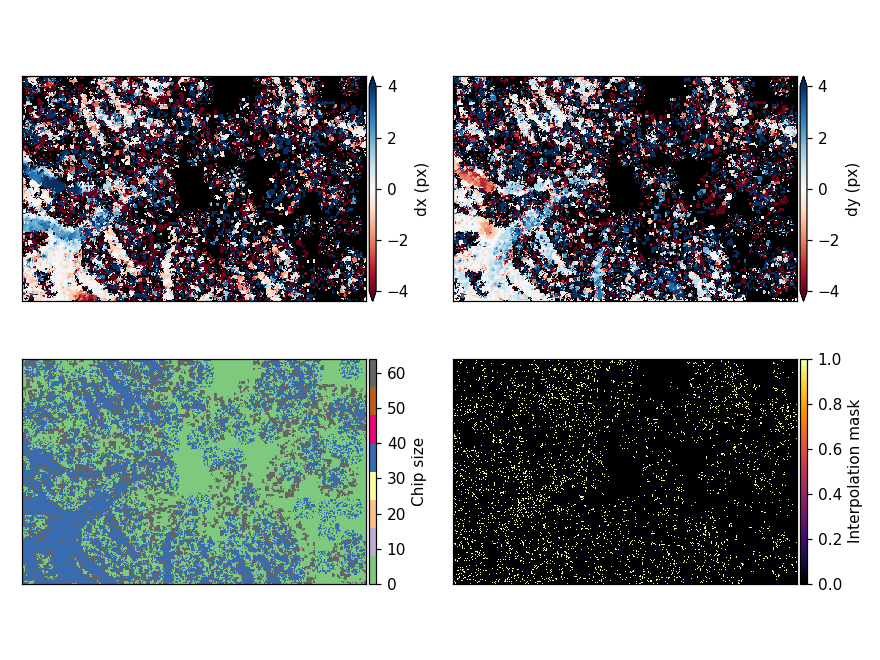

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [131]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


The more local the filter (smaller kernel size), the better its result. We need more edges :::

Now the laplacian filter ?

In [132]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 5

In [133]:
obj.preprocess_filt_lap()

In [134]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


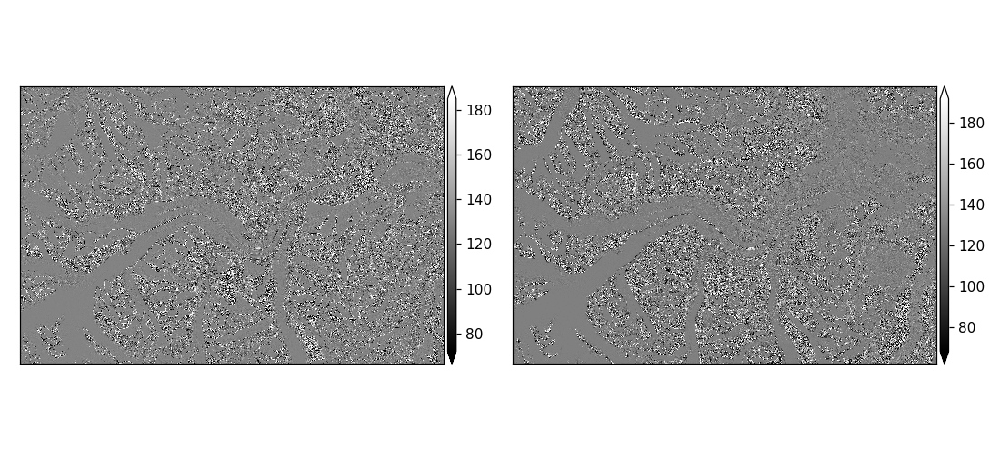

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [135]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

Ok, what did this do ? Laplacian is another high-pass filter, which also uses a convolution kernel. See this illustration [here](https://www.l3harrisgeospatial.com/docs/LaplacianFilters.html#:~:text=A%20Laplacian%20filter%20is%20an,an%20edge%20or%20continuous%20progression.).

In [136]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [137]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 50.9 s, sys: 51.4 s, total: 1min 42s
Wall time: 59.9 s


<IPython.core.display.Javascript object>


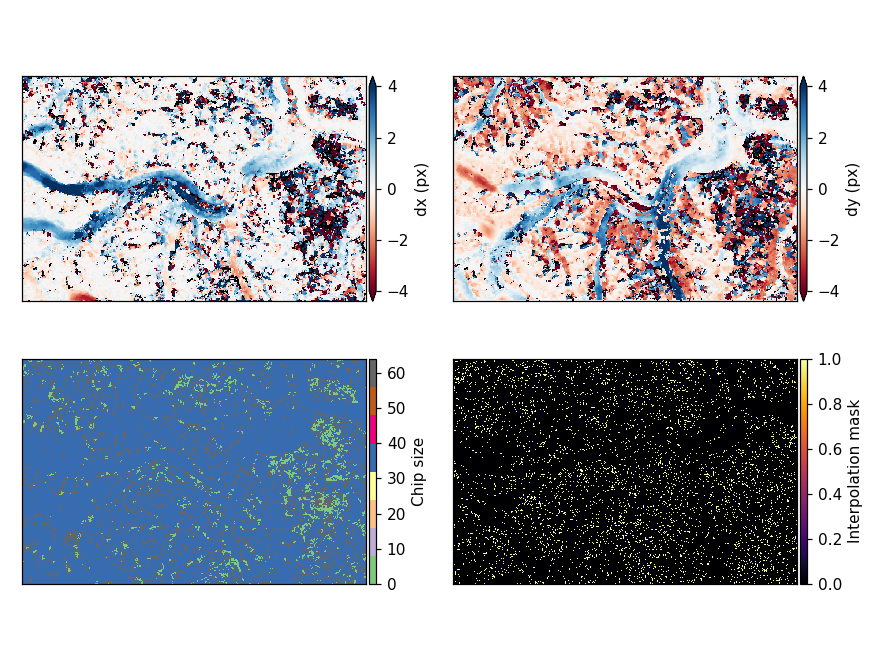

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [138]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


This seems to have been the best till now. Now the last filter to try is the lograthmic filter implemented in preprocess_db module in autoRIFT. In the simplest terms, the log function (remember the curve :)) makes the larger values more large, smaller value more small. See simple illustration in 1D below. So this acts as a constrast enhancement filter in some ways.

<IPython.core.display.Javascript object>


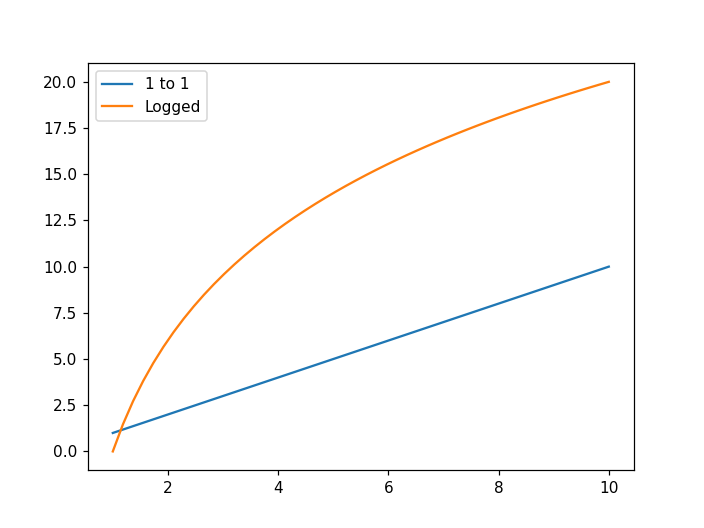

In [140]:
x_data = np.linspace(1,10)
y_data = x_data #1to1 line
y_data_logged = 20 * np.log10(x_data)
f,ax = plt.subplots()
ax.plot(x_data,y_data,label='1 to 1')
ax.plot(x_data,y_data_logged,label='Logged')
ax.legend()

In [141]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 5

In [142]:
obj.preprocess_db()

In [143]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


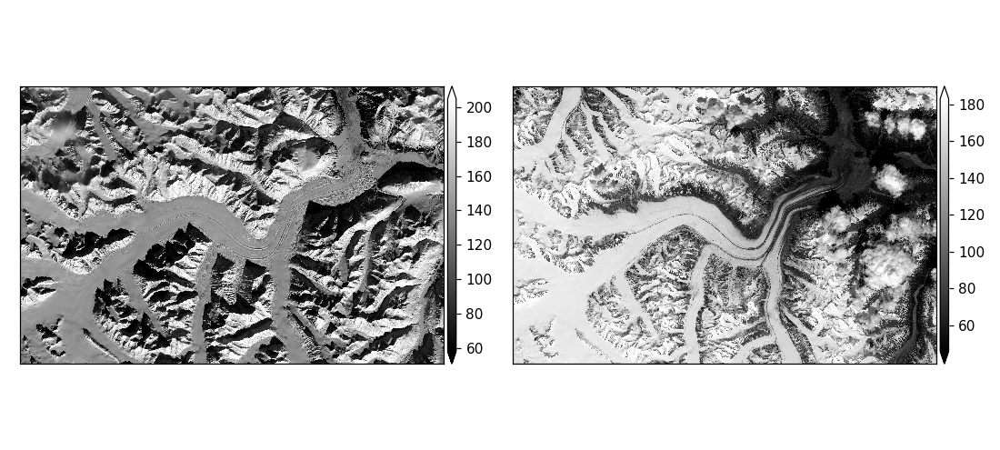

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("gray"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [144]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [145]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [146]:
#rerun correlator
%time obj.runAutorift()

/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1398: RuntimeWarning: divide by zero encountered in true_divide
  DxMadmin = np.ones(Dx.shape) / OverSampleRatio / SearchLimitX * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1399: RuntimeWarning: divide by zero encountered in true_divide
  DyMadmin = np.ones(Dy.shape) / OverSampleRatio / SearchLimitY * 2;
/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/autoRIFT/autoRIFT.py:1352: RuntimeWarning: Mean of empty slice
  C = np.nanmean(B,axis=0).reshape(output_size)


CPU times: user 48.6 s, sys: 58.1 s, total: 1min 46s
Wall time: 1min 19s


/nobackup/sbhusha1/sw/miniconda3/envs/icesat2020/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


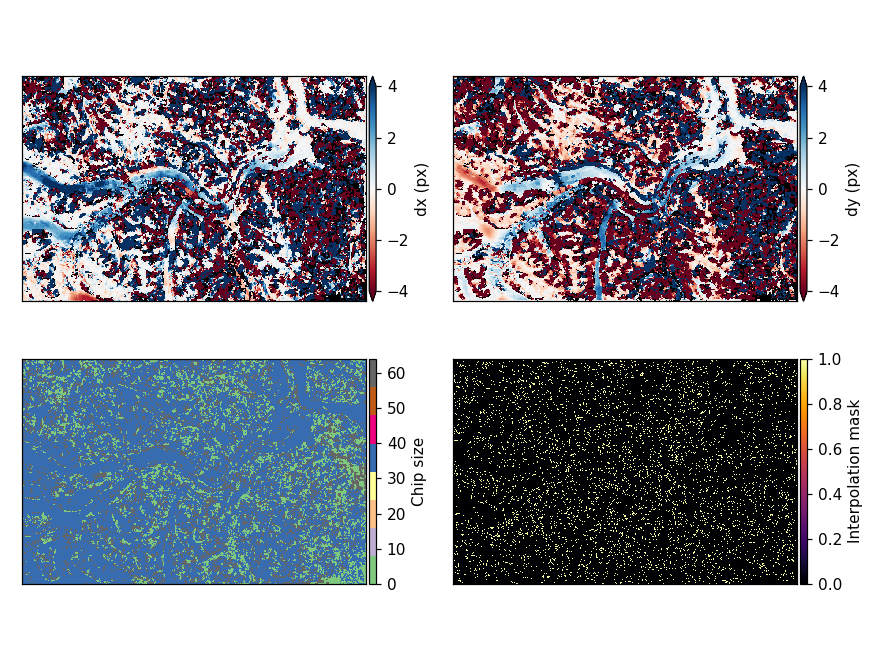

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [147]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


Now I am going to try an initial lograthmic contrast enhancement followed by laplacian filter for finding edges and then run correlation.m

In [149]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 5

In [150]:
obj.preprocess_db()

In [151]:
obj.preprocess_filt_lap()

In [152]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


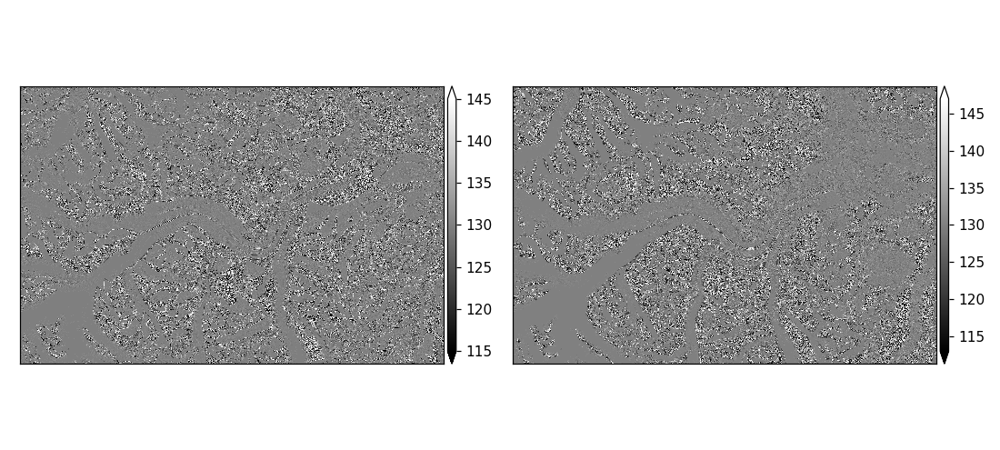

<AxesSubplot:>

In [153]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [154]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [155]:
#rerun correlator
%time obj.runAutorift()

CPU times: user 51.5 s, sys: 1min 11s, total: 2min 3s
Wall time: 2min 7s


<IPython.core.display.Javascript object>


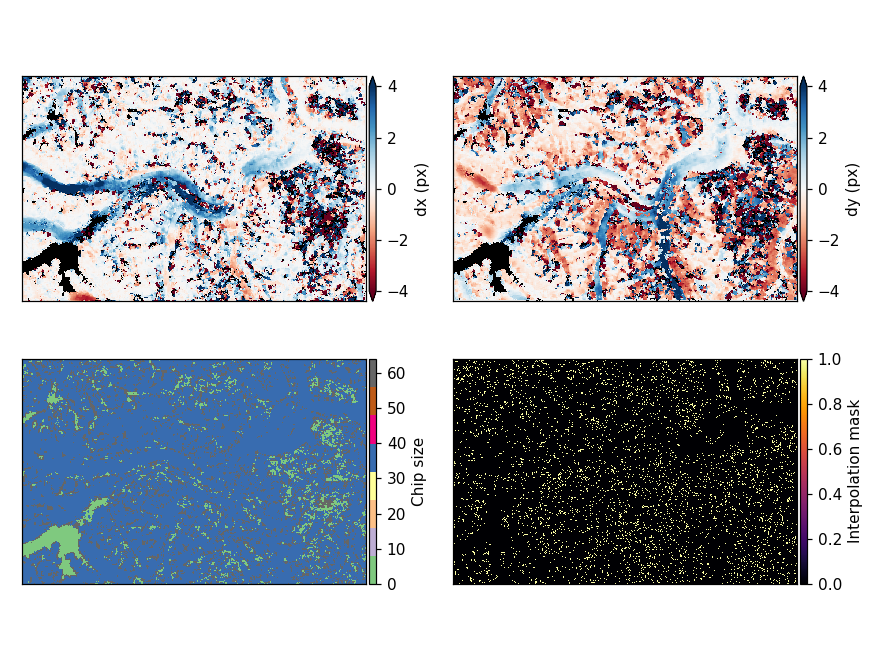

<AxesSubplot:>

In [156]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


Oh wow, this got rid of some fresh-snow pixels, but the results for other areas did not change much.

All this makes me think why did not the ASP Laplacian of Gaussian filter work ? The default width of kernel being used there is 1.4 x 4 (or 3). Maybe I need to revisit that again. Alright, I will close with the final test of using a 3 x 3 laplacian kernel for filtering.

In [157]:
obj.I1 = l_img_ma
obj.I2 = r_img_ma
obj.WallisFilterWidth = 3

In [158]:
obj.preprocess_filt_lap()

In [159]:
obj.uniform_data_type()

<IPython.core.display.Javascript object>


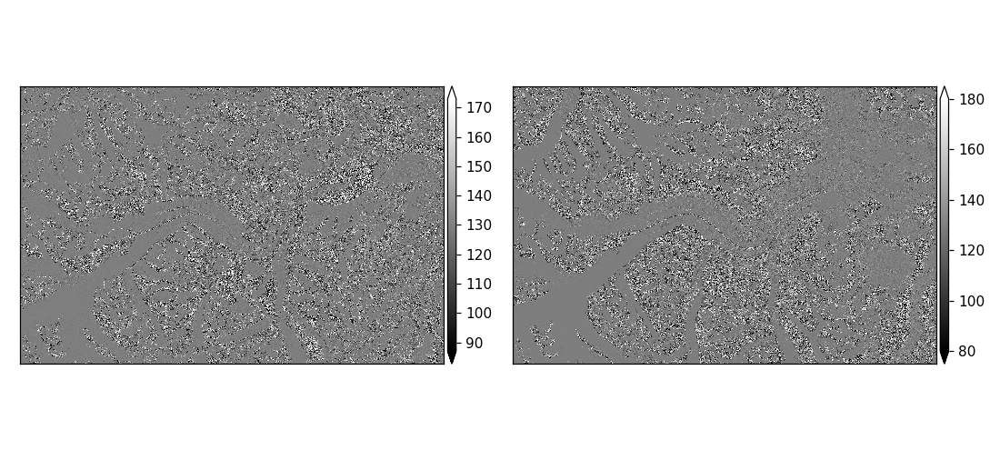

<AxesSubplot:>

In [160]:
f,ax = plt.subplots(1,2,figsize=(10,4.5))
pltlib.iv(obj.I1,ax=ax[0],cmap='gray')
pltlib.iv(obj.I2,ax=ax[1],cmap='gray')

In [161]:
obj.MultiThread = iolib.cpu_count()
obj.SearchLimitX = 10
obj.SearchLimitY = 10

In [162]:
#rerun correlator
%time obj.runAutorift()

CPU times: user 51.4 s, sys: 1min 29s, total: 2min 20s
Wall time: 3min 45s


<IPython.core.display.Javascript object>


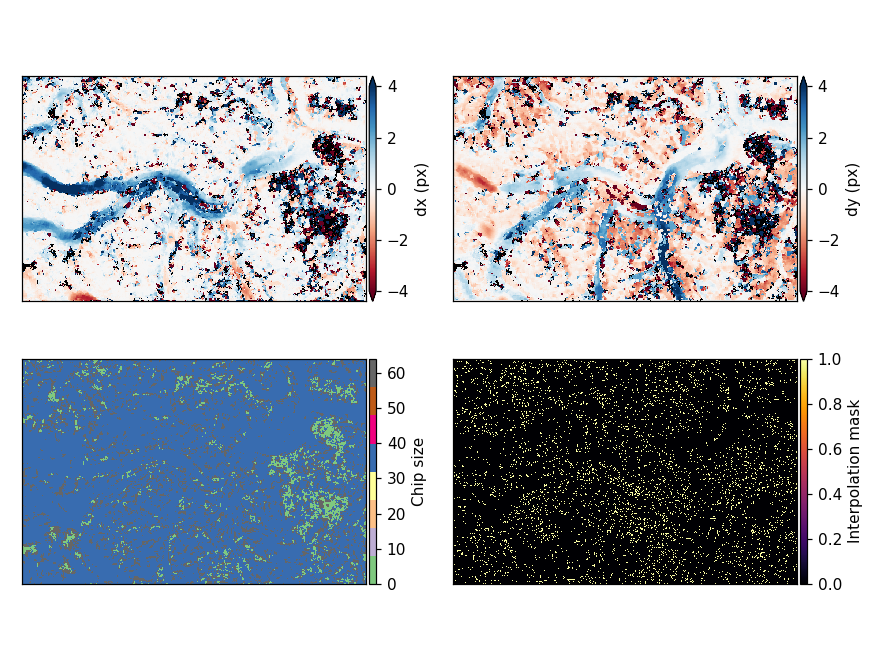

/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("Accent"))
  cmap.set_bad('k', alpha=1)
/nobackupp2/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning,

<AxesSubplot:>

In [163]:
f,axa = plt.subplots(2,2,figsize=(8,6))
clim = (-4,4)
ax = axa.ravel()
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dx,mask=noDataMask)),ax=ax[0],cmap='RdBu',label='dx (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.Dy,mask=noDataMask)),ax=ax[1],cmap='RdBu',label='dy (px)',clim=clim)
pltlib.iv(np.ma.fix_invalid(np.ma.array(obj.ChipSizeY,mask=noDataMask)),ax=ax[2],cmap='Accent',label='Chip size')
pltlib.iv(np.ma.array(obj.InterpMask,mask=noDataMask),ax=ax[3],cmap='inferno',label='Interpolation mask')


End of the day.